# Процессы и потоки в операционной системе

## Введение

В этой лекции мы разберём основные принципы работы операционных систем, общее устройство компьютера и неоторые важные понятия, связанные с этим. А также начнём изучать параллельное программирование на Python.

### Немного терминологии

**CPU (Central Processing Unit)** - центральный процессор. Это "мозг" компьютера, в нём проходят все вычислительные операции, необходимые для работы устройства. Процессоры бывают не только в компьютерах, сейчас их можно встретить в любых электронных приборах: телефонах, автомобилях, бытовой технике и т.д. Однако в компьютерах установлены самые мощные и самые сложные CPU для решения любых задач. Современные CPU также раделены на **ядра**, которые по сути являются отдельными самостоятельными процессорами.

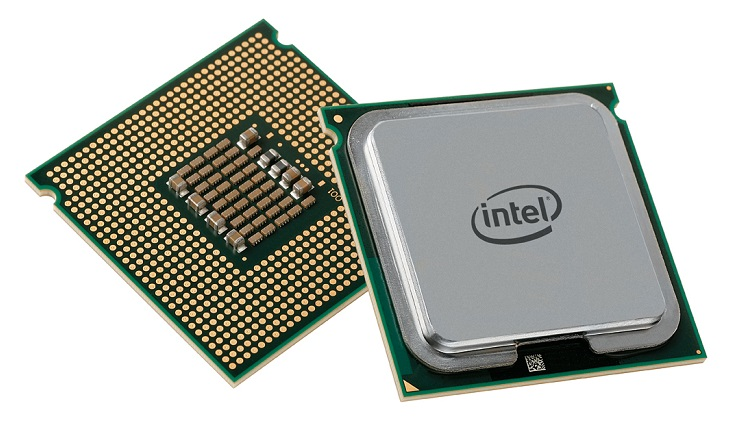

Вот так выглядит процессор. Снизу у него позолоченные контакты, а сверху теплораспределительная крышка.

Если заглянуть под крышку, то мы увидим маленький зеркальный прямоугольник - это чип процессора - кремниевый кристалл, на котором расположены все микросхемы.

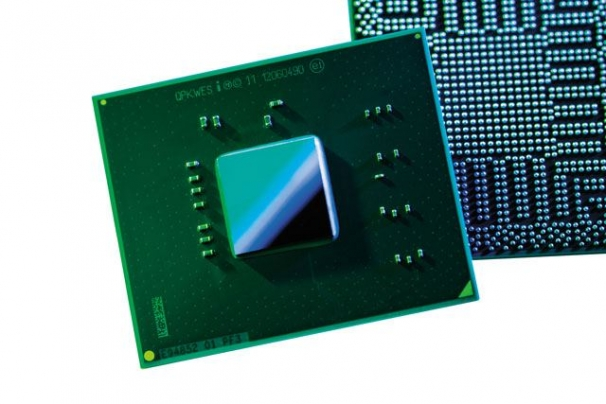

А вот так выглядит чип под микроскопом. Ярко выраженные большие голубые прямоугольники - ядра. На самом деле чип не разноцветный, но если на него попадает свет, то мы видим вот такие занимательные оптические эффекты.

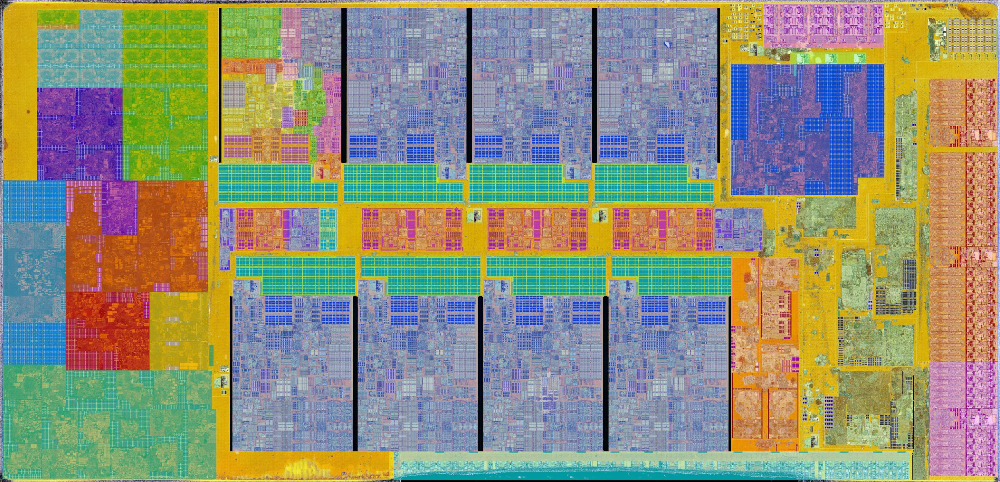

**Оперативная память (RAM, Random Access Memory, ОЗУ, Оперативное Запоминающее Устройство)** - особый вид хранилища информации, сильно отличающийся от привычных нам жёстких дисков. Если снова проводить аналогию с нашим организмом, то ОЗУ это кратковременная память. Как мы уже знаем, процессор производит различные вычислительные операции, но эти вычисления должны происходить с использованием каких-нибудь данных. Эти данные процессор получает из оперативной памяти. Информация из неё используется непосредственно процессором. Процессор никогда не считывает данные напрямую с диска. Данные всегда сначала загружаются с диска в оперативную память, а оттуда уже в процессор. Жёсткий диск же является своего рода долговременной памятью. Поэтому, чтобы произвести вычисления, компьютер должен сначала "вспомнить" информацию (то есть перевести её с жёсткого диска в ОЗУ), а после вычислений сделать всё в обратном порядке, чтобы не забыть результаты. Оперативная память очень быстрая, скорость чтения и записи для которой в десятки и сотни раз превосходят скорость записи на самые быстрые жёсткие диски. Благодаря этому процессор может практически мгновенно получать доступ к данным. Если бы оперативной памяти не было, компьютеры работали бы крайне медленно. Однако ОЗУ имеет один недостаток - всё её содержимое стирается при прекращении подачи энергии, поэтому при перезагрузке компьютера ОЗУ очищается. Обычно объём оперативной памяти для домашних компьютеров и ноутбуков находится в промежутке от 2 до 16 ГБ. Далее мы будем называть её просто "**память**".

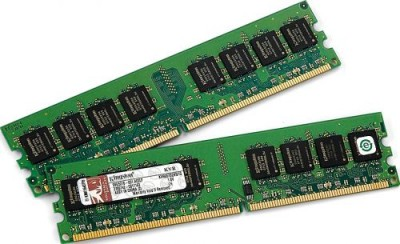

Вот так выглядит оперативная память.

**Инструкции** - команды для процессора, они также хранятся в памяти. Например, "возьми число из памяти по этому адресу", "сложи два числа", "запиши результат в память". Процессор выполняет инструкции последовательно.

**Программа** - последовательность инструкций для процессора, идущих друг за другом. Выполнение программы - последовательное выполнение инструкций.

### Что такое параллельное программирование и зачем оно нужно?

Вам известно, что программы в Pyhton исполняются последовательно, строка за строкой. Если ваша программа выполняется долго, то отдельные её части можно попробовать исполнять одновременно (параллельно). За счёт этого работа может сильно ускориться.

Итак, **параллельное программирование** - способ сделать так, чтобы различные части программы исполнялись одновременно.

Главная цель использования параллельного программирования - **ускорение работы программы**

### Процессы и потоки

Для понимания того, что происходит в компьютере на уровне операционной системы, очень важно хорошо разобраться в концепциях процессов и потоков.

**Процесс** это некоторый экземпляр выполняющейся программы. Процесс содержит набор **инструкций**, которые нужно выполнить. Они хранятся в специально выделенной для этого процесса памяти (**virtual memory**), также в этой области памяти хранятся все данные, загруженные c диска или созданные в процессе выполнения. Инструкции процесса последовательно исполняются на ядрах центрального процессора (CPU).

То есть **virtual memory** - это часть оперативной памяти, выделенная под процесс.

Обращение за пределы выделенной памяти (красная зона на рисунке) приводит к ошибкe **Segmentation Fault**.

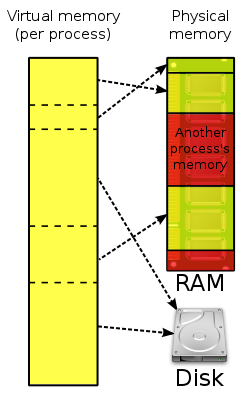

Говоря немного сложнее, виртуальная память отображается на физическую. Она может ссылаться как на оперативную память, так и на диск. Т.е. процесс вообще не подозревает о том, что существует оперативная память и жёсткий диск. Для него есть одна цельная виртуальная память, однако при обращении к каким-либо данным в виртуальной памяти процесс будет в итоге обращаться к физической памяти, но он сам не будет об этом знать. Виртуальная память может выделяться как в оперативной памяти, так и на жёстком диске.

**Поток** представляет из себя минимальную единицу исполнения программы. В простейшем случае все инструкции процесса последовательно исполняются на CPU, этот набор инструкций по сути и является **потоком**.

Снова проводя аналогию с мозгом, можно представить, что поток это некоторая **мысль**. Т.е. последовательность операций, произведённых мозгом. Например, у нас есть задача "вычислить 2 + 2 * 3". Наш мозг будет действовать с следующем порядке: определит приоритет операций, умножит 2 на 3, сложит 6 и 2, положит результат 8 в кратковременную память и, если нужно, в долговременную. Эта последовательность действий является потоком. 

Усложним ситуацию. Возьмём выражение
(2 * 5) + (3 * 4) + (2 * 3) + (5 * 5)
Нам опять нужно определить приоритет операций, произвести все умножения и сложить промежуточные 
результаты. Но мы можем разделить это выражение на несколько частей
- 2 * 5
- 3 * 4
- 2 * 3
- 5 * 5

Вместо того, чтобы нам одному считать все произведения, позовём ещё трёх друзей и дадим каждому
свой кусочек. Теперь каждому нужно будет выполнить 1 умножение, и это произойдёт быстрее чем 
если один человек будет выполнять 4 умножения. Это называется ~~научное разделение труда~~ 
разделением всего процесса на 4 потока. Каждый из них может выполняться на своём CPU 
(мозге нашего друга) независимо от других, одновременно с ними

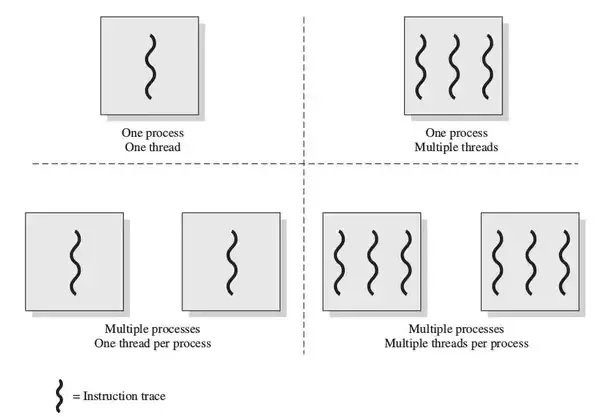

На картинке хорошо видно, что потоки всегда являются частью процесса. При этом в рамках одного процесса может существовать много потоков.

### Как работает многозадачность

Мы с вами привыкли использовать большое количество программ при работе за компьютером (браузер, telegram, тестовый редактор и т.д.) и всё это способно работать одновременно. Такой способ исполнения ещё называют *параллельным*. При этом **одновременно на одном ядре может выполняться не более одного потока**. Как же наш компьютер способен выполнять множество программ параллельно?

Логичным ответом будет: "у центрального процессора имеется несколько ядер, которые работают как самостоятельные процессоры, поэтому каждое из них способно выполнять свой набор инструкций: первое ядро - браузер, второя ядро - telegram и т.д.". Однако это ответ является правильным лишь отчасти.

Допустим у нас открыто не 4 программы, а 10, в то время как мы имеем 2-ядерный процессор. Тем не менее все они по прежнему будут работать параллельно.

К тому же возникает вопрос, как же в таком случае старые одноядерные процессоры реализовывали многозадачность?

Windows 1.0 была выпущена в 1985 году и уже тогда поддерживала многозадачность, несколько окон могли параллельно отображаться на экране и при этом в этих окнах *параллельно* могло что-то происходить. Первые же двухядерные процессоры появились только в начале 2000-ых. 

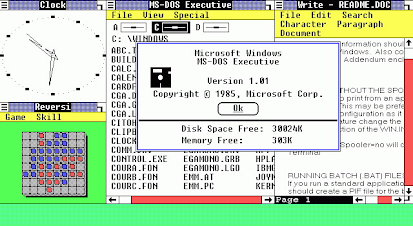

Секрет в том, что никакого *параллельного* исполнения на самом деле нет. Приложения, которые в данный момент выполняются разделены на потоки, а операционная система берёт на себя обязанности по их **переключению**, т.е. потоки всех программ исполняются последовательно, в определённые моменты уступая место на CPU другим потокам. Всё это происходит крайне быстро, в результате за 1 секунду тысячи потоков успевают исполнить часть своих инструкций на CPU последовательно, а из-за такой быстроты создаётся *иллюзия* параллельного выполнения программ.

Данный способ организации потоков сохранился и по сей день, а программа, которая занимается **переключением** потоков называется **планировщиком задач** (**job scheduler**). Планировщик, как правило, входит в состав ядра операционной системы.

Ещё раз, только на примере. Допустим, что у нас открыт telegram, видео на YouTube и игра. Для простоты представим, что у нас одноядерный процессор, а процессы запущенных программ имеют по 1 потоку. Со стороны нам кажется, что они работают одновременно. Как же это выглядит со стороны операционной системы?

Сначала на ядро процессора поступает поток телеграмма, процессор выполнит инструкции: проверит есть ли новые сообщения, если они есть, то он нарисует текст на экране и пришлёт уведомление. Затем произойдёт переключение потоков и на ядро попадёт поток браузера, где произойдёт отрисовка нового кадра видео на YouTube. После этого снова произойдёт переключение потока, на этот раз процессор будет вычислять координаты объектов в игре и выполнять их отрисовку. Казалось бы, мы перечислили очень много действий, однако всё это суммарно займёт у процессора всего несколько десятков микросекунд. А каждый из потоков и того меньше. Это происходит настолько быстро, что мы просто не способны заметить то, что всё происходит последовательно.

### Htop

Здесь и далее мы будем часто ссылаться на программу **htop**. Она доступна для Linux и MacOS и выполняет примерно те же функции, что и диспетчер задач в Windows. Она позволяет отслеживать все процессы и потоки в системе и управлять ими.

Давайте рассмотрим её поближе.

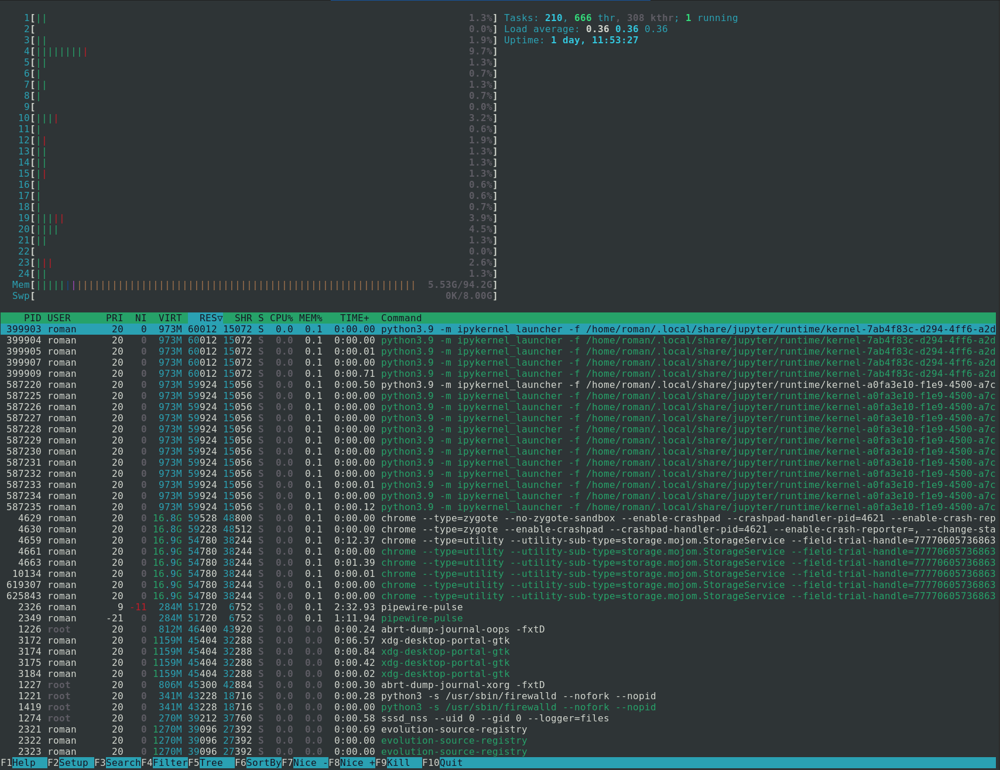

Сверху слева у нас отображены полосы, которые показывают загруженность всех ядер процессора (у меня их 24, но на самом деле это не совсем ядра, об этом дальше).

Под полосами загрузки ядер указана полоса загруженности оперативной памяти.

Далее идёт большая таблица с информацией о запущенных процессах и их потоках:

Колонка *command* показывает команду, при помощи которой процесс был запущен. Особое внимание тут нужно обратить на цвет надписи. Белый цвет означает, что перед нами *процесс*, а зелёный - *поток*. Также обратите внимание, что почти все процессы имеют несколько потоков, которые идут в списке сразу за ними и имеют такую же команду.

Колонки *CPU%* и *MEM%* показывают, как сильно процесс нагружает процессор и сколько он занимает памяти от максимального количества. При этом *CPU%* может быть больше 100%, это значит, что процесс загрузил более, чем одно ядро.

Колонка *VIRT* показывает сколько виртуальной памяти доступно процессу (о том, что такое виртуальная память, мы говорили в начале лекции).

Колонка *RES* показывает сколько оперативной памяти фактически занято полезными данными. Значение этой колонки всегда меньше значения в колонке *VIRT*. Виртуальной памяти всегда выделяется немного больше, чем нужно, так как всегда нужно иметь небольшой запас, чтобы положить туда новые данные.

Колонка *PID* показывает уникальный номер процесса.

Колонка *S* показывает статус потока. Самые основные это: "R" - поток в данный момент исполняется на процессоре и "S" - поток в данный момент "спит" и его выполнения не происходит.

## Simultaneous multithreading (Hyper-threading)

Мы часто видим (например, если откроем **htop**), что ядер в нашей системе в 2 раза больше, чем фактически. В моём компьютере 12 ядер, но в htop мы видим 24 полосы. В чём же дело? Я немного обманул вас, когда говорил, что на одном ядре может исполняться только один поток. На самом деле на одном ядре могут параллельно исполняться 2 потока. То есть одно ядро в таком случае можно представить как 2 ядра, на которых исполняется по одному потоку. Такие "условные" ядра принято называть **логическими**, они представляют из себя как бы мини-ядра CPU, которые позволяют параллельно исполнять инструкции на них.

Ещё разок, физически в моём компьютере есть только 12 ядер CPU. Но каждое из них может исполнять параллельно 2 потока (о том как, мы поговорим дальше). Таким образом, максимальное количество одновременно исполняемых потоков для всего процессора целиком становится равным 24 (по 2 на каждое из 12 ядер). Поэтому при выборе процессора в магазине вы постоянно будете видеть фразы: "4 ядра 8 потоков", "2 ядра 4 потока" и т.д. Эти ядра поэтому и называются логическими, посколько не имеют физической формы, это просто возможность исполнить на одном физическом ядре два потока. Эти **логические ядра** также часто называют просто **потоками**, как в примере с описанием процессоров в магазине, и это ни в коем случае не стоит путать с потоками, о которых мы говорили до этого. Есть **поток == часть процесса**, а есть **поток == логическое ядро**

Попробуем разобраться, как же это работает?

Можно представить, что процессор состоит из различных модулей, выполняющих разные задачи. Среди них можно довольно грубо следующие:

+ Модуль чтения/записи данных
+ Модуль сложения целых чисел
+ Модуль сложения чисел с плавающей точкой
+ Модуль вычисления логических операций и др.

Эта схема имеет мало отношения к действительности и служит лишь для упрощения понимания.

Возможности выполнения инструкций этими модулями называют **ресурсами** процессора. Т.е. если мы складываем много чисел с плавающей точкой, то мы говорим, что используется ресурс сложения чисел с плавающей точкой и т.д.

Понятно, что один поток может не задействовать все **ресурсы** процессора. Процессор не может одновременно записывать данные, складывать числа и вычислять логические выражения. Из этого следует, что во время исполнения потока у нас некоторое количество ресурсов (модулей) остаётся без работы. И здесь приходит на ум совершенно логичная идея - позволить другому потоку занимать свободные ресурсы. Таким образом, это позволяет нам максимально использовать доступные ресурсы ядра, которые будут разделены между двумя потоками.

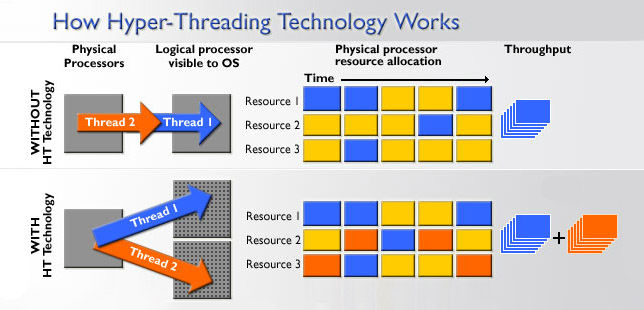

Можно привести пример из жизни. Представьте, что ресурсы процессора это набор цветных карандашей. Каждый карандаш имеет свой цвет и они не повторяются.

Представим, что один человек решил нарисовать рисунок карандашом. В каждый момент времени он будет использовать только один карандаш, т.е. один ресурс. Другие же карандаши будут свободны. Ими может воспользоваться уже другой человек, который будет рисовать свой рисунок параллельно с первым. Как вы уже поняли, эти два человека - потоки.

Рассмотрим более сложную ситуацию. Допустим, что первый человек занят длительной монотонной работой - он рисует море синим карандашом. Но второй человек тоже хочет нарисовать море, однако синий карандаш занят. Выходит так, что у второго человека не получится выполнить свою задачу. Получается, что два потока, использующие одни и те же ресурсы, не получают никакой выгоды от многопоточности. Два потока, выполняющих сложение чисел с плавающей точкой, не смогут нагрузить 2 логичесих ядра.

Из-за подобных ситуаций, разделение физического ядра на два логических практически никогда не даёт прирост в производительности в 2 раза. В среднем, эффективность вычислений при использовании данной технологии составляет около 20-30%.

Впервые эту технологию придумали ещё в 50-х годах XX века инженеры из компании IBM. Примерно тогда прижилось и название Simultaneous multithreading (на русском - одновременная многопоточность). Введению этой технологии в широкую практику и в потребительские процессоры в частности поспособствовала компания Intel в конце 90-х. Их технология называлась Hyper-threading (гиперпоточность), название очень хорошо прижилось и сейчас употребляется почти для всех вариаций этой технологии, независимо от производителя.

In [1]:
import requests
import numpy as np
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'requests'

In [4]:
import random
import time


# Типы задач

Все задачи, выполняемые компьютером, можно разделить на две большие категории:
+ Задачи, сильно нагружающие процессор, занимающие большое количество его ресурсов. Такие задачи называются **CPU bound** (дословно - "связанные с CPU"). Эти задачи используют процессор на полную, а значит скорость выполнения таких задач тем выше, чем выше мощность процессора.
+ Задачи, занимающиеся операциями ввода/вывода. Они называются **IO bound** (дословно - "связанные с вводом-выводом"). При выполнении таких задач процессор часто простаивает и ничего не делает, так как ожидает завершения операций ввода-вывода. Два наиболее ярких примера это **запросы в интернет** и **чтение с диска**. Данные из интернета в среднем поступают со скоростью 1-100 МБ/с, а с диска 10МБ-5ГБ/с. Для процессора эти скорости ОЧЕНЬ медленные. При поступлении новых данных он их очень быстро обрабатывает и начинает ждать следующей порции данных. То есть в промежутках между поступлениями порций данных процессор не делает ничего. Скорость выполнения таких задач ограничена скоростью поступления данных, это или скорость чтения/записи диска или скорость вашего интернета, процессор ничего не может с этим поделать.

## CPU bound задачи

Это задачи в которых узким местом по времени выполнения выступает производительность CPU. Как правило, их можно ускорить аппаратно за счёт повышения частоты процессора. Это всевозможные вычисления и, например, майнинг криптовалют.

В ячейке ниже приведён пример типичной CPU bound задачи - большое количество вычислений между целыми числами.

In [5]:
def do_work():
    for _ in range(10000000):
        random.randint(1, 40) ** random.randint(1, 20)

В Jupyter notebook есть множество "магических" модификаторов для ячеек, они начинаются с %% и пишутся в самой первой строке ячейки. Модификатор **%%time** позволит нам узнать время выполнения ячейки.

In [6]:
%%time
do_work()

CPU times: user 18.9 s, sys: 170 µs, total: 18.9 s
Wall time: 18.9 s


Разберём сообщение, генерируемое модификатором %%time:

Нас интересуют два числа:
+ CPU times - время работы процессора
+ Wall time - общее время выполнения кода

Они не обязательно равны друг другу, так как процессор в некоторые моменты выполнения программы может ничего не делать.

Мы видим, что общее время работы (Wall time) равно времени работы процессора (CPU times). Это значит, что процессор был загружен всё время и не отдыхал ни в один момент времени.

## IO bound tasks

Это задачи в которых узким местом по времени выполнения выступают операции ввода-вывода. Это происходит из-за того, что чтение и запись данных происходит намного медленнее, чем их обработка, поэтому процессор длительное время простаивает, ожидая новой порции данных. Например, функция ниже делает указанное число запросов на главную страницу Google.

In [4]:
def n_requests(n):
    for _ in range(n):
        requests.get("https://google.com/")

In [5]:
%%time
n_requests(15)

CPU times: user 418 ms, sys: 27.4 ms, total: 446 ms
Wall time: 9.95 s


Мы видим, что 15 запросов суммарно заняли 9.95 секунд, в то время как процессор работал всего 446 мс. То есть около 5% всего времени, затраченного на запросы. Остальные 95% времени процессор ничего не делал.

То же самое верно и для одиночного запроса.

In [6]:
%%time
requests.get("https://google.com/")

CPU times: user 29.9 ms, sys: 1.15 ms, total: 31.1 ms
Wall time: 620 ms


<Response [200]>

И CPU, и IO bound задачи можно ускорить при помощи параллельного выполнения, однако способы реализации отличаются довольно сильно. Вы уже могли заметить, что получить прирост в скорости, исполняя IO bound задачи параллельно, намного проще, поскольку в них имеется большое кол-во свободных ресурсов процессора в отличии от CPU bound.

# Управление потоками в Python. Модуль threading

Для начала мы поговорим о реализации многопоточности. Мы уже говорили о том, что на одном ядре может параллельно исполняться 1-2 потока. К тому же в операционной системе существует планировщик задач, способный очень быстро переключать исполняющиеся потоки, создавая иллюзию параллельного выполнения сотен и тысяч потоков. В итоге мы приходим к логичному решению - ускорить наш код, разбив его инструкции на несколько потоков.

Модуль **threading** предоставляет интерфейс для управления потоками в Python.

In [7]:
import threading

Основной класс - **Thread**. Он принимает на вход функцию *target* (по своей сути это и есть набор инструкций для потока, но пока не проинтерпретированных) и аргументы *args* к этой функции. Соответственно каждый поток будет исполнять данную функцию с переданными аргументами. 

Полученный объект класса **Thread** имеет 2 основных метода: **start** и **join**. *start* запускает исполнение потока, а *join* "говорит" интерпретатору подождать пока поток не закончит исполнение.

## Использование threading для ускорения IO bound задач

In [12]:
def parallel_requests(num_requests, n_threads):
    threads = [threading.Thread(target=n_requests, args=(num_requests // n_threads,)) for _ in range(n_threads)]
    for thread in threads:
        thread.start()
    for thread in threads:
        thread.join()        

Функция выше принимает на вход количество запросов, которые нужно сделать, а также число потоков на которые требуется распараллелить запросы. Каждый поток, представляет из себя объект класса `Thread`. В функции мы создаём `n_threads` таких потоков в списке, и каждому потоку даём по `num_requests // n_threads` запросов, т.е. делим их поровну между потоками. Функция `n_requests`, описанная нами ещё выше будет представлять из себя непосредственно инструкции для потока (определённое количество запросов в интернет)

In [16]:
%%time
parallel_requests(15, 15)

CPU times: user 326 ms, sys: 42.8 ms, total: 369 ms
Wall time: 729 ms


В результате имеем прирост к скорости выполнения приблизительно в 10 раз, относительно того же количества запросов в одном потоке. В вызове выше произошло разделение 15 запросов на 15 потоков (то есть по одному запросу на поток).

Также заметим, что теперь время работы CPU составляет около **50%** от общего время работы, что очень хорошо. Это значит, что мы смогли более эффективно использовать процессорное время и он меньше простаивал.

### Метод join

Но всё ещё может быть не совсем понятно, зачем нужен *join*. Посмотрим на примере:

In [18]:
def random_sleep():
    sleep_time = random.randint(1, 10)
    time.sleep(sleep_time)
    print(sleep_time)

Функция `time.sleep` тоже является IO bound задачей, так как мы принудительно заставляем процессор ничего не делать. Это очень похоже на состояние, когда мы читаем с диска или из интернета, только в случае `time.sleep` потребляется совсем ничтожное количество ресурсов процессора. В примере ниже процессор был загружен 0.03% от всего времени.

In [21]:
%%time
time.sleep(10)

CPU times: user 176 µs, sys: 2.91 ms, total: 3.08 ms
Wall time: 10 s


Вернёмся к `join`. Запустим 10 потоков, каждый из которых будет спать случайное время, а затем сразу запустим следующую ячейку, не дожидаясь исполнения предыдущей.

In [26]:
threads = [threading.Thread(target=random_sleep) for _ in range(10)]
for thread in threads:
    thread.start()
for thread in threads:    
    thread.join()

1
2
2
2
4
4
5
7
7
8


In [27]:
print("Something")

Something


Мы видим, что исполнение ячейки `print("Something")` не началось, пока не завершилось исполнение всех потоков в ячейке выше. Этого не происходит из-за `join`.

Теперь попробуем сделать тоже самое, но без использования `join`

In [28]:
threads = [threading.Thread(target=random_sleep) for _ in range(10)]
for thread in threads:
    thread.start()

In [29]:
print("Thread has not finished yet!")

Thread has not finished yet!
1
1
3
4
4
5
5
6
8
9


В этом случае исполнение следующей ячейки началось сразу же, без ожидания выполнения всех потоков. К тому же печать "Thread has not finished yet!" завершилась раньше любого из них.

Всё это, конечно, здорово, но всё равно не совсем понятно, как и зачем это использовать.

Зачастую мы хотим распараллелить только часть задачи, которую нам нужно сделать. Например, мы параллельно скачиваем данные с 100 различных сайтов, а сразу после этого хотим их как-то обработать. Чтобы исполнение нашего кода не ушло к стадии обработки данных не дождавшись завершения их скачивания (почти как в примере выше) и нужен *join*. Для наглядной иллюстрации запустим скрипт **threading_join_demo.py**. Давайте представим, что `time.sleep` - это какая-то IO bound задача, например скачивание таблиц с интернета, а строка `print("Main thread!")` как-то обрабатывает эти данные. Запустив скрипт, мы увидим, что он всё равно не завершится пока все потоки не "скачают данные", однако их "обработка" произойдёт намного раньше их полного скачивания, что крайне нежелательно. Поэтому мы и используем `join`, мы не хотим, чтобы после запуска потоков выполнение программы убегало вперёд не дождавшись их.

Заодно мы можем посмотреть как запуск этого скрипта выглядит в **htop**.

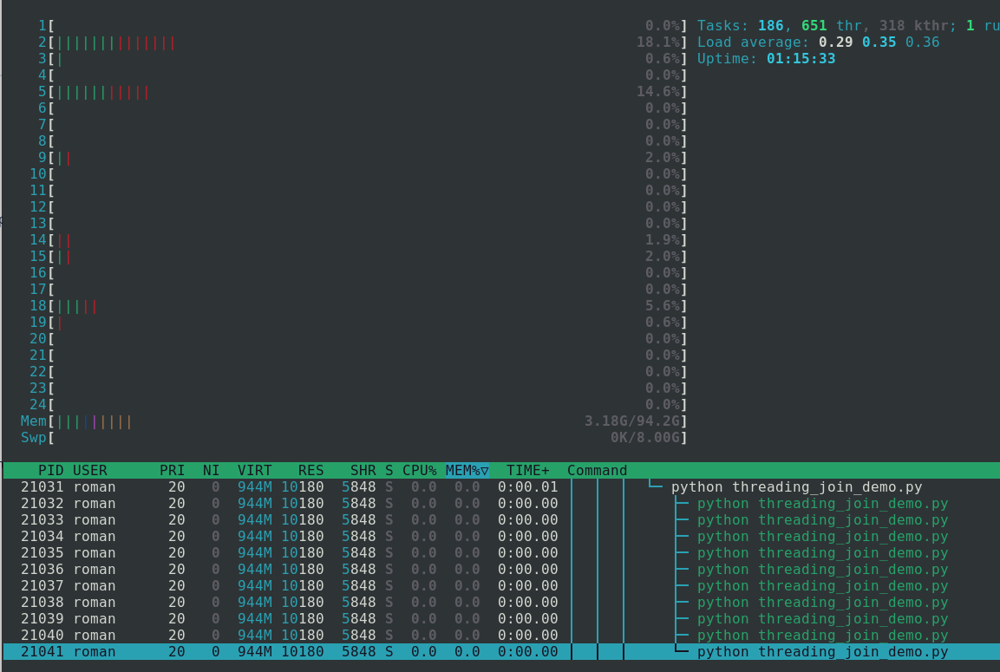

Обратите внимание на колонку *command*. Мы видим один **процесс** нашей программы, он выделен белым цветом и 10 зелёных **потоков**, каждый из которых спит и ничего не делает (колонка *S*). 

На самом деле потоков здесь 11. Один из них прячется за белыми буквами, так как изначально каждый процесс имеет один главный поток. В нём как раз и происходит выполнение всего основного кода программы: создание списка потоков, запуск списка потоков, печать в строчке `print("Main thread!")`

### Ограничения threading

Потоки являются довольно легковесными, они требуют мало памяти и их можно создать довольно много. На картинке видно, что кратное увеличение количества потоков приводит к **практически** кратному уменьшению времени необходимому для совершения запросов. Слово **практически** здесь выделено не случайно, дело в том, что когда потоков становится очень много, затраты процессорного времени на их постоянное переключение тоже становятся очень большими, поэтому эффективность постепенно снижается. Если бы этих затрат не было, то 100 запросов в 100 потоках на картинке снизу (фиолетовая линия) исполнялись бы за 0.6 секунд, а не за 4 как на картинке.

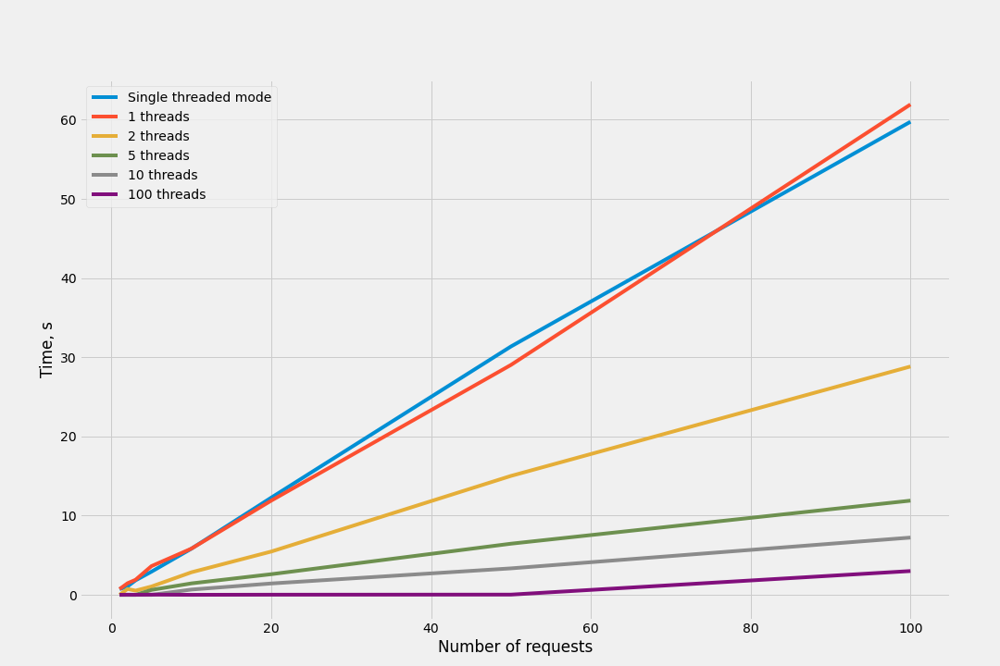

# Продолжаем работать с threading

## 3 способа использовать threading

### Самый простой

Наиболее простой и безболезненный способ сделать многопоточность. Плюс в том, что можно совершенно не забивать голову тем, как это работает, но если что-то пойдёт не так, то не понятно что делать.

На этот раз нужный класс лежит в другом модуле. Модуль **concurrent.futures** предоставляет нам удобные функции для высокоуровнего использования параллельного программирования.

In [8]:
from concurrent.futures import ThreadPoolExecutor
import requests
from threading import Thread
import time

ModuleNotFoundError: No module named 'requests'

In [9]:
%%time

n_requests = 100
n_threads = 50

with ThreadPoolExecutor(n_threads) as pool:                                 # Создаём пул с заданным числом потоков
    results = pool.map(requests.get, ["https://google.com/"] * n_requests)  # Применяем функцию к контейнеру с аргументами для этой функции 
    print(type(results), list(results)[:5])                                 # Получаем результаты исполнения функций из генератора results

NameError: name 'requests' is not defined

Класс `ThreadPoolExecutor` создаёт специальный объект &mdash; контекстный менеджер. Этот тип объектов умеет работать с конструкциями `with`, как в случае файлов. `open("some_file.txt")` тоже возвращает контекстные менеджер. При создании этого объекта мы должны указать число потоков, которые мы используем. У данного объекта есть метод `map`, он принимает функцию, которая должна исполняться внутри потока, а также список **всех** данных, которые нужно обработать.

При вызове `map` происходит магия. `pool` берёт и создаёт количество потоков, которое мы указали и равномерно распределяет данные по потокам. Т.е. нам ссовершенно не нужно беспокоиться о том, как передавать данные в поток. Нам всего-лишь нужна функция, которая что-то делает с данными (`requests.get` в примере) и сами данные для этой функции (100 адресов гугла). Всё распределится "само" и выполнится максимально эффективно. При этом нам ещё вернутся результаты в виде генератора.

### Чуть сложнее

Здесь потребуются знания базового интерфейса модуля **threading**, по скорости - то же самое, что и **ThreadPoolExecutor**. Плюсы в том, что позволяет более гибко настраивать поток, удобнее передавать аргументы, по-желанию можно не делать *join*, который в **ThreadPoolExecutor** делается автоматически. Минус - чуть больше букв (5 строк на самый базовый запрос).

In [11]:
import threading

In [5]:
%%time
def make_requests(url_list):
    for url in url_list:
        requests.get(url)

        
n_requests = 100
n_threads = 50
threads = [threading.Thread(target=make_requests, args=(["https://google.com/"] * (n_requests // n_threads),)) for _ in range(n_threads)]
for thread in threads:
    thread.start()
for thread in threads:
    thread.join()     

CPU times: user 2.7 s, sys: 297 ms, total: 3 s
Wall time: 2.29 s


### Сложно

Создание собственного класса-наследника **Thread**. Здесь от нас требуется переопределить метод **run** - это код, который будет исполняться в потоке. По желанию, можно дописать конструктор и любые другие методы. Плюс - супер гибкая настройка потока, минус - ещё больше букв, хотя интерфейс простой и запутаться здесь сложно. По скорости опять таки без изменений.

In [7]:
%%time

class MyThread(threading.Thread):
    def __init__(self, url_pool):
        super().__init__()    # Нужно сначала инициализировать объект конструктором родительского класса
        self.url_pool = url_pool
    
    def run(self):
        for url in self.url_pool:
            requests.get(url)
            
            
n_requests = 100
n_threads = 50
    
threads = [MyThread(["https://google.com/"] * (n_requests // n_threads)) for _ in range(n_threads)]

for thread in threads:
    thread.start()
for thread in threads:
    thread.join()     

CPU times: user 2.57 s, sys: 281 ms, total: 2.85 s
Wall time: 2.26 s


С классом мы можем делать что угодно: например, добавлять новые методы и атрибуты, но главное не забыть:

+ Отнаследоваться от класса Thread
+ Сделать `super().__init__()` в конструкторе
+ Переопределить метод `run`

Метод `run` не принимает аргументов, поэтому если мы захотим передать данные в поток, то дожны будем сделать это через конструктор, сохранив их в атрибуты. Содержимое метода `run` непосредственно является инструкциями потока. Там мы пишем абсолютно любой код, который мы хотим распараллелить

## Пример применения многопоточности НЕ в запросах к интернету

Пока что мы говорили только про применение многопоточности в IO bound задачах. Но прежде чем перейти к CPU bound, давайте рассмотрим ещё один пример использования многопоточности. Для этого сформулируем задачу:

**Задача:** Раз в секунду программа в бесконечном цикле печатает число 0. При нажатии на любую кнопку программа продолжает печатать, но уже нажатый символ. Между событиями печати не должно проходить более 1 секунды.

Наивное решение, которое первое приходит на ум:

In [8]:
character = "0"
while True:
    print(character)
    time.sleep(1)
    character = input()

0


 1


1


 2


2


KeyboardInterrupt: Interrupted by user

**input** блокирует основной поток программы, то есть прерывает её исполнение до поступления данных. Это ещё один пример IO bound задачи, процессор ничего не делает пока ждёт ввода от пользователя. Кажется нам понадобится сторонняя библиотека (см. скрипты **threading_use_case_base.py**, **threading_use_case_full.py**, т.к. либе нужны права администратора, то надо запускать из терминала). Но также приведу код здесь, но не факт, что он будет работать.

In [11]:
import keyboard

In [12]:
number = 0
while True:
    print(number)
    time.sleep(1)
    number = keyboard.read_key()

0


ImportError: You must be root to use this library on linux.

Такой способ уже имеет одно заметное приемущество &mdash; нам не нужно нажимать на **Enter** чтобы ввести символ, однако выполнение программы по прежнему блокируется. Но не спешите расстраиваться! Ведь когда мы делаем запрос в интернет наша программа тоже блокируется и ничего не делает, только это происходит гораздо быстрее. По сути обе ситуации являются типичными IO bound задачами, а значит мы можем использовать многопоточность.

In [14]:
class KeyboardListener(Thread):
    def __init__(self, active_number):
        Thread.__init__(self)
        self.active_number = active_number

    def run(self):
        while True:
            self.active_number = keyboard.read_key()
            if self.active_number == "esc":
                return


number = "0"
listener = KeyboardListener(number)
listener.start()
while True:
    print(number)
    time.sleep(1)
    number = listener.active_number

Exception in thread Thread-158:
Traceback (most recent call last):
  File "/home/roman/anaconda3/lib/python3.9/threading.py", line 973, in _bootstrap_inner
    self.run()
  File "/tmp/ipykernel_40123/3826479094.py", line 8, in run
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/__init__.py", line 935, in read_key
    event = read_event(suppress)
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/__init__.py", line 924, in read_event
    hooked = hook(queue.put, suppress=suppress)
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/__init__.py", line 461, in hook
    append(callback)
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/_generic.py", line 67, in add_handler
    self.start_if_necessary()
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/_generic.py", line 35, in start_if_necessary
    self.init()
  File "/home/roman/anaconda3/lib/python3.9/site-packages/keyboard/__init__.py", line 196, in ini

0
0
0
0
0
0
0


KeyboardInterrupt: 

Код выше решает поставленную нами ранее задачу. Давайте разберёмся как он работает.
Вся суть в том, что мы полностью принимаем тот факт, что мы **не можем** передать программе информацию о нажатии кнопки без блокировки её исполнения. Однако, что если функционал детекции нажатых нами кнопок мы переложим на отдельный поток? Таким образом основной поток не будет прерываться и будет каждую секунду печатать число, а поток для детекции будет постоянно заблокированным до нажатия на кнопку.

Теперь конкретно разберём пример. Класс **KeyboardListener** будет создавать поток, который в бесконечном цикле как бы "прослушивает" нажатия кнопок на клавиатуре и сохраняет последнюю нажатую кнопку в атрибут `active_number`. При этом большую часть времени он заблокирован и ждёт нажатия.

Мы создаём объект потока в главном потоке программы и запускаем его. Очень важно отметить, что здесь мы не используем `join`, так как мы не хотим ждать пока этот поток завершится, мы хотим сразу продолжить выполнять программу дальше.

При этом на каждой итерации цикла по печати текущего числа мы "подсматриваем" его у потока, обращаясь к его атрибуту `number = listener.active_number`.

## Доступ к данным при многопоточности

До сих пор мы использовали потоки только для того, чтобы распараллеливать задачи и даже не задумывались от том, что зачастую нам нужно получть данные, которые были получены в потоке. Например, в случае с интернет запросами, мы хотим получать статус, запроса, его содержимое и так далее. Но как нам вернуть эти данные их потока? И возможно ли это вообще?

Краткий ответ - ДА. Мы уже видели, что при использовании `ThreadPoolExecutor` мы можем получить в распоряжение генератор с результатами. Однако остаётся вопрос &mdash; как это работает?

Поскольку потоки принадлежат одному процессу, они все имеют общую память, которой обладает процесс. Любой поток может производить операции с этой памятью. Например, потоки могут добавлять элементы в список, объявленый в глобальной области видимости, но несколько удобнее обмениваться данными через атрибуты объекта потока (как в примере выше).

Для того, чтобы убедиться в том, что все потоки имеют доступ ко всей памяти процесса, разберём игрушечный пример. Мы запустим 3 потока, каждый из которых будет спать случайное время и записывать число в список из главного потока.

In [12]:
import random

In [66]:
lst = []

def append_to_list(thread_id):
    time.sleep(random.randint(1, 5))
    lst.append(thread_id)

threads = [threading.Thread(target=append_to_list, args=(i,)) for i in range(3)]
for thread in threads:
    thread.start()

In [70]:
lst

[2, 0, 1]

Получилось! В списке есть 3 числа, значит все потоки смогли добавить туда по одному элементу. Получается, что потоки могут обмениваться данными друг с другом.

### А что если попробовать получить доступ к данным одновременно?

Попытаемся изменить первый элемент списка *lst* сразу 10 потоками. Как вы думаете, что же произойдёт?

In [102]:
lst = [0, 0, 0]

def append_to_list(thread_id):
    time.sleep(1)
    lst[0] = thread_id

threads = [threading.Thread(target=append_to_list, args=(i,)) for i in range(10)]
for thread in threads:
    thread.start()

In [103]:
lst

[6, 0, 0]

### Ничего. Но как тогда потоки решили, кто именно из них в итоге запишет число?

Ладно. Мы долго скрывали это от вас, но пришло время раскрыть все карты...

**Потоки в питоне не выполняются параллельно!**

Но как же так? Мы же видели, что увеличение количества потоков позволяет в десятки и сотни раз повысить скорость выполнения серии запросов в интернет. А также детектировать нажатия на клавиатуру пока работает основной поток.

# Во всём виноват GIL

Начнём издалека. Дело в том, что операции одновременного доступа к данным, которые мы пытались совершить в предыдущем примере крайне небезопасны и могут привести к неопределённым последствиям и повреждению данных. Вследствие этого в питоне предусмотрено специальное средство, обеспечивающее безопасность обращения потоков к общим данным - **Global Interpreter Lock**(**GIL**). Разные языки по разному борются с этой проблемой, однако тем не менее позволяют исполнять потоки одного процесса по-настоящему **параллельно**.

В питоне решили поступить более радикально, **запретив** исполнять более одного потока **одновременно** на уровне интерпретатора для обеспечения потокобезопасности. **Таким образом *многопоточность* в питоне выглядит практически полностью аналогично *многозадачности* в старых одноядерных CPU**.

То есть если мы имеем 100 потоков, то интерпретатор будет переодически переключать их между собой, создавая иллюзию параллельного выполнения.

В случае добавления элементов в список интерпретатор **гарантирует**, что это произойдёт последовательно, поскольку в каждый момент времени работает только один поток. Когда поток приступает к работе и выполняет CPU bound задачу GIL переходит в закрытое состояние (**acquire**). В данном состоянии GILa ни один поток кроме данного не может выполняться и переключения потоков тоже не может произойти. Интерпретатор питона не может переключать потоки во время выполнения CPU bound задачи, так как это может нарушить нормальный ход её выполнения. Когда в потоке начинается I/O часть, GIL открывается (**release**) и интерпретатор выбирает новый поток для выполнения, пока первый занят I/O задачей, интерпретатор же сразу закрывает GIL и так пока всё не закончится.

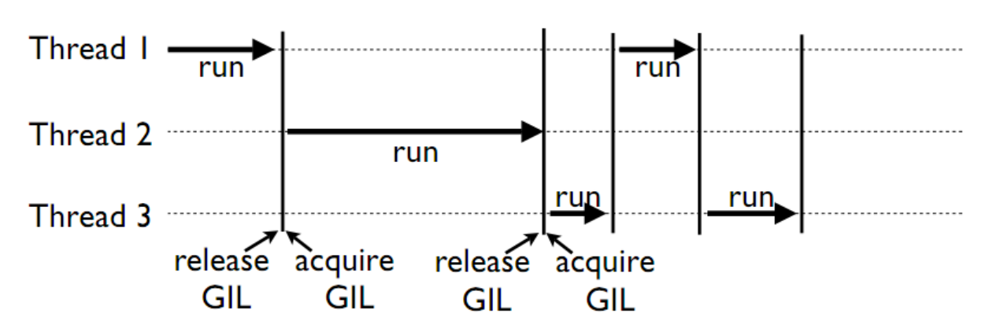

Это очень сложный механизм и, если пока ничего не понятно, то это совсем не страшно. Главное, что нужно запомнить &mdash; **потоки в питоне исполняются последовательно, а не параллельно, аналогично *многозадачности* в старых одноядерных CPU**

Из вышеперечисленного следует, что потоки не могут решать CPU bound задачи, так как **они работают только последовательно**. Докажем это на примере.

In [8]:
def do_work(dummy=None):
    for _ in range(1000000):
        random.randint(1, 40) ** random.randint(1, 20)

Мы сделали точно такую же функцию `do_work`, как в начале предыдущей лекции. Она иллюстрирует типичную CPU bound задачу &mdash; математические вычисления. К тому же мы добавили ей один аргумент, который не нужен для расчётов, но пригодится для вызова функции.

Измерим время выполнения функции

In [13]:
%%time

do_work()

CPU times: user 1.06 s, sys: 3.23 ms, total: 1.06 s
Wall time: 1.06 s


А теперь посмотрим, какое время займёт последовательное выполнение этой функции 10 раз

In [14]:
%%time

for _ in range(10):
    do_work()

CPU times: user 10.7 s, sys: 0 ns, total: 10.7 s
Wall time: 10.8 s


Ровно в 10 раз больше, всё логично.

Теперь попробуем запустить эту функцию 10 раз в 10 потоках (то есть по одной на поток). Сделаем мы это при помощи `ThreadPoolExecutor`. Для этого нам и нужен был бесполезный аргумент в `do_work`. Для использования в `ThreadPoolExecutor` наша функция обязательно должна принимать хотя бы один аргумент.

In [15]:
%%time

with ThreadPoolExecutor(10) as pool:
    pool.map(do_work, [None for _ in range(10)])

CPU times: user 19.5 s, sys: 69.4 ms, total: 19.6 s
Wall time: 19.5 s


И всё отработало даже хуже, чем при последовательном исполнении. Как мы видим, потоки совершенно не справляются с ускорением IO bound задач

Поскольку функция **do_work** не имеет никакого I/O, GIL не будет отпускать данные потоки на протяжении всего выполнения. Это значит, что их переключение будет происходить крайне редко. Это будет приводить к сильным задержкам в исполнении инструкций других потоков. С увеличением числа потоков время ожидания сильно увеличивается.

Для демонстрации того, что одновременно в питоне работает только один поток, запустим скрипт **GIL_demo.py** (код ниже) и **htop**.

In [148]:
def do_work():
    for _ in range(100000000):
        random.randint(1, 40) ** random.randint(1, 20)


threads = [threading.Thread(target=do_work) for i in range(2)]
for thread in threads:
    thread.start()

do_work()

KeyboardInterrupt: 

Вспоминаем, что колонка *S* показывает статус процесса/потока: *R* - активен, *S* - бездействует.

Мы видим, что в любой момент времени, активен только один поток, в то время как оставшиеся два - спят. Это всё из-за GIL.

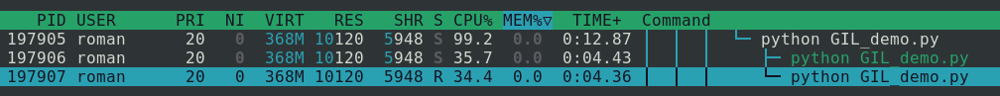
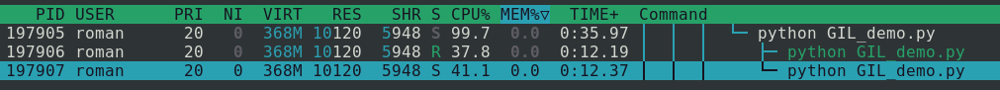
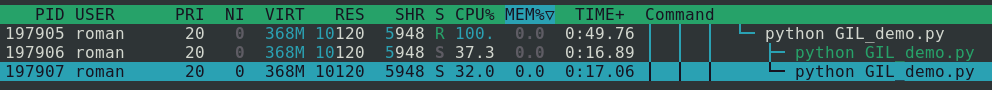

Но почему же тогда IO bound задачи ускорялись, если потоки исполняются последовательно? 

По сути там происходит параллельное **ожидание**. Если в момент, когда у нас началось ожидание (например, интернет запрос на 2 секунды), потоки переключатся, то мы сразу же получаем приемущество, поскольку в новом потоке мы делаем что-то полезное, а в потоке, который мы оставили по прежнему идут эти 2 секунды, которые нам нужно было подождать.

То есть в случае многопоточности в питоне, мы распараллеливаем не полезные вычисления, а ожидание.

## Итоги по threading

**Когда стоит использовать:**
+ Параллельные интернет запросы
+ Неблокирующий ввод-вывод (задача с нажатием кнопок)
+ Запараллеливание любого достаточно медленного I/O

**Плюсы:**
+ Легковесные (но лучше не запускать больше 1000, расходы на их переключение в один момент начинают быть слишком большими)
+ Можно использовать общую память

**Минусы:**
+ Нет настоящей параллельности из-за GIL (в интернете все пишут, что это очень не круто, особенно программисты на C++, но он реально избавляет от кучи головной боли с синхронизацией потоков)
+ Совсем не могут в CPU bound задачи из-за первого минуса

# Multiprocessing

Название говорит само за себя, вместо использования множества потоков, здесь используется множество процессов. В Python многопроцессорность реализуется модулем **multiprocessing** стандартной библиотеки. Его основной интерфейс полностью повторяет интерфейс **threading**, поэтому про него здесь говорить не будем. Так же как и в **threading** здесь есть базовый класс **Process** с методами **start** и **join**, всё по аналогии.

Ниже приведены 3 способа использовать **multiprocessing** по аналогии с **threading**, убедитесь, что они очень похожи.

### Самый простой

In [16]:
from concurrent.futures import ProcessPoolExecutor

In [23]:
%%time

n_requests = 10
n_proc = 10

with ProcessPoolExecutor(n_proc) as pool:                               
    results = pool.map(requests.get, ["https://google.com/"] * n_requests)
    print(type(results), list(results)[:5])                                 

<class 'generator'> [<Response [200]>, <Response [200]>, <Response [200]>, <Response [200]>, <Response [200]>]
CPU times: user 10.3 ms, sys: 44.9 ms, total: 55.3 ms
Wall time: 509 ms


### Чуть сложнее

In [18]:
import multiprocessing

In [24]:
%%time

def make_requests(url_list):
    for url in url_list:
        requests.get(url)

        
n_requests = 10
n_proc = 10
processes = [multiprocessing.Process(target=make_requests, args=(["https://google.com/"] * (n_requests // n_proc),)) for _ in range(n_proc)]
for proc in processes:
    proc.start()
for proc in processes:
    proc.join()     

CPU times: user 6.4 ms, sys: 33.6 ms, total: 40 ms
Wall time: 229 ms


### Сложно

In [26]:
%%time

class MyProcess(multiprocessing.Process):
    def __init__(self, url_pool):
        super().__init__()
        self.url_pool = url_pool
    
    def run(self):
        for url in self.url_pool:
            requests.get(url)
            
            
n_requests = 10
n_proc = 10
    
processes = [MyProcess(["https://google.com/"] * (n_requests // n_proc)) for _ in range(n_proc)]
for proc in processes:
    proc.start()
for proc in processes:
    proc.join()     

CPU times: user 5.33 ms, sys: 29.9 ms, total: 35.3 ms
Wall time: 376 ms


In [28]:
%%time

for _ in range(10):
    requests.get("https://google.com/")

CPU times: user 308 ms, sys: 13.2 ms, total: 321 ms
Wall time: 1.96 s


Как вы видите, всё идентично, кроме названий классов. К тому же мы заодно убедились в том, что процессы успешно справляются с IO bound задачами (запросы в интернет)

Как мы уже видели, потоки не справляются с CPU bound задачами.

In [29]:
def do_work():
    for _ in range(1000000):
        random.randint(1, 40) ** random.randint(1, 20)

In [30]:
%%time
do_work()

CPU times: user 1.19 s, sys: 1.86 ms, total: 1.19 s
Wall time: 1.19 s


In [31]:
%%time
n_threads = 2

threads = [threading.Thread(target=do_work) for _ in range(n_threads)]
for thread in threads:
    thread.start()
for thread in threads:
    thread.join()     

CPU times: user 2.44 s, sys: 3.52 ms, total: 2.44 s
Wall time: 2.44 s


Попробуем сделать тоже самое на процессах. Создадим 2 процесса, которые выпоняют CPU bound вычисления в `do_work` и заодно посмотрим сколько времени занимает один вызов этой функции

In [32]:
%%time

do_work()

CPU times: user 1.12 s, sys: 406 µs, total: 1.12 s
Wall time: 1.12 s


In [33]:
%%time
n_proc = 2
procs = [multiprocessing.Process(target=do_work) for _ in range(n_proc)]
for proc in procs:
    proc.start()
for proc in procs:
    proc.join()     

CPU times: user 104 µs, sys: 10.9 ms, total: 11 ms
Wall time: 1.11 s


Два процесса выполнились **параллельно** за то же самое время, что и один. Почему же так произошло? В чём различия с **threading**?

Мы знаем, что процесс это набор инструкций, хранящихся в памяти и процесс их исполнения. Изначально программа на питоне представлена всего одним процессом, он создаётся в момент запуска интерпретатора. Т.е. для создания процесса нужно просто запустить новую копию интерпретатора. Это помогает нам избавиться от проблемы GIL. Нет, он никуда не исчезнет, наоборот, теперь в каждом из созданных процессов будет свой GIL, блокирующий параллельное исполнение потоков (кстати, в созданных процессах можно также создавать потоки и процессы). Однако поскольку сами процессы представляют из себя отдельный запуск интерпретатора, они являются полностью изолированными друг от друга. Они НЕ имеют общей памяти, а GIL процесса может воздействовать только на внутренние потоки, но никак не на другие процессы.

Суммируя всё сказанное выше, ничто не мешает отдельным питоновским процессам исполняться параллельно на разных ядрах CPU, поскольку GIL имеет власть только внутри одного процесса. Полностью аналогичного эффекта можно достичь запустив ваш скрипт несколько раз на разных наборах данных прямо из терминала, но это не удобно.

### 2 процесса мало, хочу ещё больше

In [34]:
%%time
n_proc = 4

procs = [multiprocessing.Process(target=do_work) for _ in range(n_proc)]
for proc in procs:
    proc.start()
for proc in procs:
    proc.join()     

CPU times: user 4.05 ms, sys: 12 ms, total: 16.1 ms
Wall time: 1.1 s


И мы успешно выполнили параллельно 4 функции `do_work` за тоже самое время

### 8 процессов

In [35]:
%%time
n_proc = 8

procs = [multiprocessing.Process(target=do_work) for _ in range(n_proc)]
for proc in procs:
    proc.start()
for proc in procs:
    proc.join()     

CPU times: user 3.1 ms, sys: 33 ms, total: 36.1 ms
Wall time: 1.14 s


### 12 процессов

In [36]:
%%time
n_proc = 12

procs = [multiprocessing.Process(target=do_work) for _ in range(n_proc)]
for proc in procs:
    proc.start()
for proc in procs:
    proc.join()     

CPU times: user 2.12 ms, sys: 39.5 ms, total: 41.6 ms
Wall time: 1.38 s


Невероятно круто! Мы смогли параллельно запустить целых 12 функций `do_work` и они всё ещё занимают столько же времени, сколько и одна. Последовательно же 12 функций выполнялись бы долго... 

In [37]:
%%time

for _ in range(12):
    do_work()

CPU times: user 12.7 s, sys: 9.39 ms, total: 12.8 s
Wall time: 12.8 s


### Отлично, как насчёт 36 процессов?

In [38]:
%%time
n_proc = 36

procs = [multiprocessing.Process(target=do_work) for _ in range(n_proc)]
for proc in procs:
    proc.start()
for proc in procs:
    proc.join()     

CPU times: user 11.2 ms, sys: 78.3 ms, total: 89.5 ms
Wall time: 3.28 s


### И время почему-то увеличилось более чем в 2 раза...

?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????
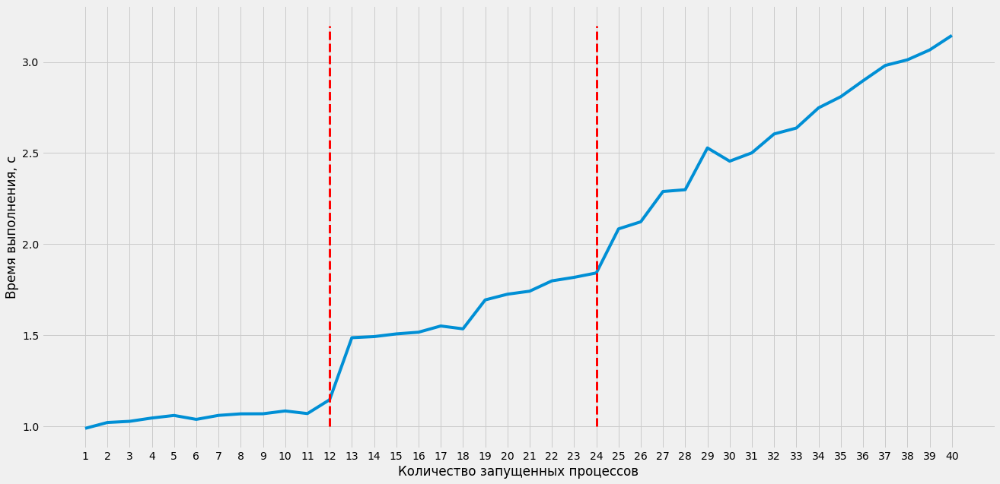
?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????

## Доступ к данным

У потоков было всё очень хорошо и прозрачно в отношении доступа к данным. А что с процессами? Тут всё очень просто, его нет)))

Попробуем провернуть тот же фокус с добавлением элементов в список как в случае с **threading**. Создадим три процесса, которые будут добавлять числа в список, находящийся в глобальном окружении.

In [56]:
lst = []

def append_to_list(pid):
    time.sleep(random.randint(1, 5))
    lst.append(pid)
    print(lst)

procs = [multiprocessing.Process(target=append_to_list, args=(i,)) for i in range(3)]
for proc in procs:
    proc.start()
    proc.join()

[0]
[1]
[2]


In [53]:
lst

[]

Список пустой, но и ошибки никакой не произошло. Куда же добавляли элементы процессы? Выведем содержимое lst внутри процессов, предварительно заполнив его.

In [54]:
lst = ["P", "r", "o", "c", "e", "s", "s"]

def append_to_list(pid):
    time.sleep(random.randint(1, 5))
    lst.append(pid)
    print(f"Process: {pid}, lst = {lst}")

procs = [multiprocessing.Process(target=append_to_list, args=(i,)) for i in range(3)]
for proc in procs:
    proc.start()
    proc.join()

Process: 0, lst = ['P', 'r', 'o', 'c', 'e', 's', 's', 0]
Process: 1, lst = ['P', 'r', 'o', 'c', 'e', 's', 's', 1]
Process: 2, lst = ['P', 'r', 'o', 'c', 'e', 's', 's', 2]


In [55]:
lst

['P', 'r', 'o', 'c', 'e', 's', 's']

Очень страннно... Оказывается, что каждый процесс сохраняет себе собственную копию *lst* и добавляет в него число. *lst* же в главном процессе остаётся без изменений. Такое поведение происходит из самого механизма создания процессов в операционной системе.

Создание процесса происходит с помощью системного вызова **fork()** (в python он реализован как os.fork()). Системный вызов это специальная функция, которую использует операционная система для своей работы. При этом происходит создание полной копии процесса, в котором fork был вызван. Начальный процесс теперь является **родителем**, а новый процесс **потомком**. Изначально они являются полностью одинаковыми, но потомки вскоре начинают изменяться в зависимости от нужд. При завершении родительского процесса автоматически завершаются все его потомки.

Когда мы пользуемся модулем **multiprocessing** мы своими глазами не видим вызова **fork**, но он происходит внутри, в тот момент, когда мы создаём объект класса **Process**.

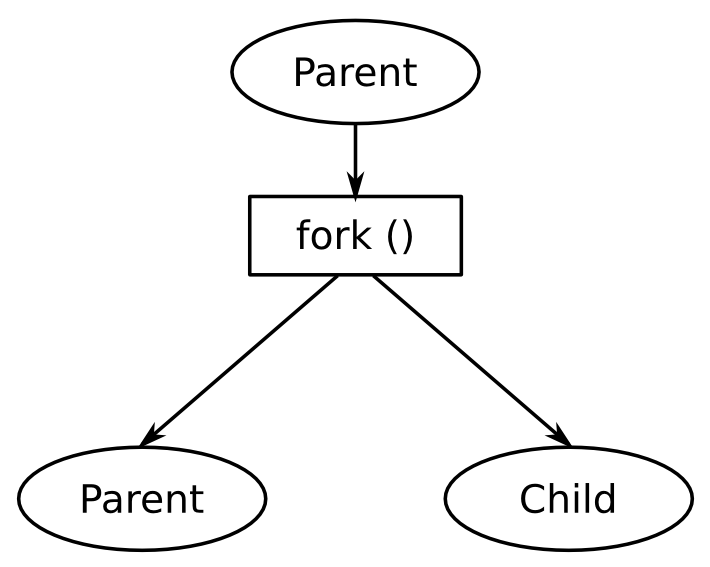

В нашем случае при создании процесса он стал полной копией процесса-родителя, а значит сохранил ВСЕ переменные объявленные в нём, в т.ч. и *lst*. После этого события память процессов становится изолированной друг от друга, а значит и обмен данными невозможен (почти).

Если оооочень сильно хочется, то можно использовать:
+ [Специальные типы данных](https://docs.python.org/3/library/multiprocessing.html#module-multiprocessing.sharedctypes), позволяющие изменять их из другого процесса
+ [Пайпы](https://docs.python.org/3/library/multiprocessing.html#multiprocessing.Pipe) (говоря очень упрощённо, это файлы через которые происходит общение между процессами посредством записи/чтения оттуда).

Но лучше не надо)

## Итоги по multiprocessing

**Когда стоит использовать:**
+ Любые CPU bound задачи
+ I/O bound задачи, но с поправкой на то, что создавать процессы гораздо более накладно в плане занимаемой ими памяти.

**Плюсы:**
+ Настоящая параллельность на разных ядрах CPU
+ Максимально безопасны в отношении доступа к памяти

**Минусы:**
+ Тяжеловесны
+ Один процесс - одно ядро. Если у нас мало ядер, то очень большое ускорение получить не выйдет.
+ Нельзя пользоваться общей памятью

**Примечание:** Самый частый use-case - распараллеливание вычислений. Если нам нужно обрабатывать какие-то большие таблицы, картинки или что-то ещё. Для этого мы обязательно берём **multiptocessing**, большинство вычислений это зачастую CPU bound. Возвращаемся наверх к 3 способам **multiprocessinga** и выбираем любой понравившийся

# Асинхронное программирование

Сейчас мы поговорим об ещё одном способе ускорить IO bound задачи в питоне. Речь об **асинхронном программировании**. Этот способ очень сильно похож на многопоточность, но и имеет много отличий. Давайте разберём всё по порядку.

В Python асинхронное программирование можно использовать при помощи модуля **asyncio** стандартной библиотеки, а также при помощи ключевых слов *async* и *await*.

Асинхронное программирование подразумевает **параллельное ожидание** I/O событий. Однако такое же поведение реализуется при многопоточности, в чём же различия?

Дело в том, что в асинхронном программировании потоки не создаются, вместо них мы имеем сопрограммы (**coroutines**). Сопрограмма это по прежнему некоторый набор инструкций (в случае питона - просто функция), но для её выполнения не создаётся отдельный поток. Рассмотрим, как это работает.

Допустим, что у нас есть 3 функции с длительным временем ожидания I/O, которые исполняются подряд (первая картинка). Всё это будет работать очень медленно. **threading** решает эту проблему путём создания 3 потоков (по 1 на каждую функцию) и мы действительно увидим ускорение в 3 раза. Проблема возникает в случае, если у нас становится очень много таких функций, например 10000. Создание 10000 потоков крайне дорогая операция, они потребуют крайне много памяти и времени на их переключение, скорее всего ОС даже может зависнуть.

**asyncio** позволяет запускать эти функции, которые в данном случае будут называться **сопрограммами**, в одном потоке. Допустим, что мы делаем запрос в интернет. После короткой CPU bound части нам придётся долго ждать. Ожидание это всегда плохо, так как процессор простаивает. **asyncio** же позволяет нам запускать другие сопрограммы в то время как остальные ждут, чтобы максимально использовать процессорное время. Этим занимается так называемый **цикл событий** (**event loop**). Цикл событий имеет в своём составе набор сопрограмм. Он постоянно проверяет состояние каждой из них. В случае, если в данный момент нет никаких других исполняющихся сопрограмм, он может поставить исполняться новую. Результаты выполнения сопрограмм также возвращаются в цикл событий после их завершения.

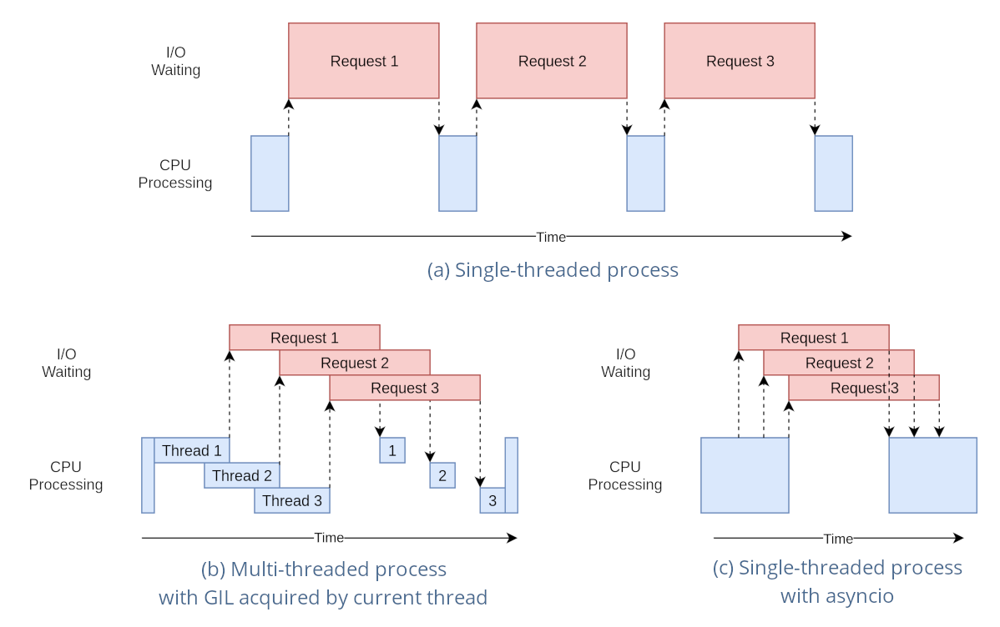

На 3 картинке мы можем видеть как это работает. При начале ожидания IO в сопрограмме, исполнение мгновенно перехватывается другой сопрограммой и так далее. Получается, что не операционная система, а сам питон контролирует своевременное переключение сопрограмм, которые являются как бы очень мини версиями потоков.

Проще всего объяснить ассинхронное программирование на примере Макдональдса. Представим, что заказ на кассе это работа CPU, а приготовление заказа IO, так как мы просто ждём.

В ситуации с последовательным выполнением кассир принимает наш заказ и сам уходит его готовить. Всё это занимает очень много времени и образуется большая очередь клиентов.

В ситуации с многопоточностью у нас появляется несколько кассиров, каждый из которых после принятия заказа уходит его готовить. Становится немного быстрее и очередь клиентов слегка уменьшается, но мы не очень хотим платить зарплату нескольким кассирам...

И наконец в случае с асинхронным программированием кассир принимает заказ и отдаёт его на кухню, и тут же начинает принимать следующий заказ. Очередь полностью исчезает, а клиенты довольны быстрым обслуживанием. Мы конечно же допускаем, что приготовление заказа это банальное бездействие, в реальности это конечно же не так)

Собственно рестораны фаст-фуда самым непосредственным образом реализуют ассинхронный подход, который, забегая вперёд, является самым эффективным средством ускорения IO bound задач. Поэтому фаст-фуд и называют быстрым)

Импортируем необходимые модули

In [1]:
import asyncio
import time

Если при создании функции добавить ключевое слово **async**, то созданная функция будет являться сопрограммой (обозначать, что она является асинхронной async - с англ. асинхронный).

In [58]:
async def func():
    time.sleep(2)
    print("Smth")
    
def f():
    pass

Функция **f** является обычной функцией. Если её вызвать, то мы получим результат.

In [59]:
print(f())

None


In [66]:
await func()

Smth


При "вызове" функции **func** как такового вызова не происходит, происходит лишь создание **coroutine object**, который потом может быть запущен. Это очень сильно похоже на генераторы и, на самом деле, в ранних версиях 3 питона всё асинхронное программирования работало на генераторах.

Для "запуска" сопрограмм существует ключевое слово **await** (с англ. ожидать). На самом деле это не совсем запуск, **await** как бы говорит циклу событий, что данную сопрограмму можно начать исполнять, а сопрограмма из которой **await** был вызван будет ждать завершения.

In [63]:
my_coroutine = func()
await my_coroutine       # Простой пример, здесь цикл событий задан неявно, он существует но мы его не видим
                         # await подаёт циклу событий сигнал, что он может начать исполнять сопрограмму func
                         # цикл событий же определяет может ли он выполнить её в данный момент и запускает её

Smth


Как результат, мы видим, что сопрограмма выполнилась. Пока она была только одна и ни про какое распараллеливание речи не шло

**await** может применяться ТОЛЬКО к сопрограммам (у данных объектов должен быть определён метод *\_\_await\_\_*, но вам в 99.9999999% ситуаций не понадобится писать классы, поддерживающие асинхронные инструкции)

In [2]:
async def sleep_log(corountine_id, sleep_time):
    print(f"Coroutine {corountine_id} fell asleep for {sleep_time} seconds")
    await asyncio.sleep(sleep_time)
    print(f"Coroutine {corountine_id} woke up")
    return "Success"

В примере выше мы создаём сопрограмму, которая принимает некоторый численный идентификатор (только для того, чтобы опознать её при печати) и количество секунд на которое она должна уснуть. Заметьте, что сон реализован не при помощи привычного нам `time.sleep`, а при помощи специальной сопрограммы `asyncio.sleep`. Она делает тоже самое, но при этом является сопрограммой. Вообще в библиотеке **asyncio** очень много асинхронных функций, дублирующих некоторые синхронные функции. Чуть позже мы поймём зачем это нужно.

А пока запустим 2 сопрограммы подряд и посмотрим, выполнятся ли они за меньшее время

In [70]:
await sleep_log(1, 5)
await sleep_log(2, 4)

Coroutine 1 fell asleep for 5 seconds
Coroutine 1 woke up
Coroutine 2 fell asleep for 4 seconds
Coroutine 2 woke up


'Success'

Увы нет. Мы видим, что первая сопрограмма начала исполняться и поспала 5 секунд. Вторая же в это время исполняться ещё не начала

Если "вызвать" две сопрограммы подряд, то они выполнятся последовательно. Для того, чтобы всё было асинхронно, нужно использовать специальные функции из **asyncio**.

Можно создать объект **Task** из наших сопрограмм, цикл событий уже может адекватно с ними работать

Функция `asyncio.create_task` принимает уже созданную сопрограмму и возвращает нам объект типа **Task**. По сути этот объект является некоторой обёрткой над сопрограммой, делая возможным их ассинхронное выполнение. Другие его свойства довольно сложны для понимания и зачастую не нужны для обычного использования.

Запустим код ниже, где мы создаём 3 задачи (Task) и запускаем их через *await*

In [71]:
start = time.time()

task1 = asyncio.create_task(sleep_log(1, 5))
task2 = asyncio.create_task(sleep_log(2, 5))
task3 = asyncio.create_task(sleep_log(3, 5))

result1 = await task1
result2 = await task2
result3 = await task3
print(result1, result2, result3, f"Finished in {time.time() - start:.2f} seconds")

Coroutine 1 fell asleep for 5 seconds
Coroutine 2 fell asleep for 5 seconds
Coroutine 3 fell asleep for 5 seconds
Coroutine 1 woke up
Coroutine 2 woke up
Coroutine 3 woke up
Success Success Success Finished in 5.00 seconds


Цикл событий не дружит с магическими модификаторами по типу %%time, поэтому мы замеряем время вручную.

Теперь мы видим, что всё получилось, функции исполнились за 5 секунд, хотя последовательно они исполнялись бы 15. Что же там произошло?

Первая сопрограмма начала исполнение и сначала напечатала сообщение о том, что она засыпает. После этого она запускает сопрограмму сна (`await asyncio.sleep(sleep_time)`) и это самый ключевой момент! *await* тут же сообщает циклу событий, что была запущена асинхронная функция. А если цикл событий видит, что асинхронная функция ничего не делает (а `asyncio.sleep` как раз ничего не делает), то он тут же передаёт управление другой асинхронной функции, а следующая на очереди у нас `task2`, где произойдёт тоже самое.

С `task3` уже будет по-другому. Она также напечатает строку и запустит сопрограмму сна. Теперь у цикла событий нет активных сопрограмм, он не может переключиться на другую, так как все спят. Поэтому он терпеливо ждёт, переодически проверяя не проснулась ли какая-нибудь из сопрограмм. Как только он заметит, что одна из них проснулась (скорее всего это будет первая, так как она уснула раньше всех), он тут же переключится на неё и она закончит исполнение, напечатав сообщение о пробуждении. Такая же судьба далее постигнет оставшиеся две сопрограммы.

Есть один очень важный момент. Цикл событий может переключать сопрограммы только в местах с вызовами *await*. Он не сможет переключить первую сопрограмму на вторую до печати первой строки.

Из этого следует, что любой код между инструкциями *await* выполняется синхронно

Можно вызвать функцию **asyncio.gather**, которая позволяет забыть о создании **Taskов** и прочих неочевидных вещах. Мы просто передаём в эту функцию наши сопрограммы. Внутри всё произойдёт само: создастся цикл событий, сопрограммы превратятся в объекты Task и будут вызваны через *await*. К тому же нам ещё вернутся результаты исполнения сопрограмм, давайте посмотрим на их формат

In [79]:
async def sleep_log(corountine_id, sleep_time):
    print(f"Coroutine {corountine_id} fell asleep for {sleep_time} seconds")
    time.sleep(sleep_time)
    print(f"Coroutine {corountine_id} woke up")
    return "Success"

In [80]:
results = asyncio.gather(sleep_log(1, 1), sleep_log(2, 2), sleep_log(3, 3))

Coroutine 1 fell asleep for 1 seconds
Coroutine 1 woke up
Coroutine 2 fell asleep for 2 seconds
Coroutine 2 woke up
Coroutine 3 fell asleep for 3 seconds
Coroutine 3 woke up


In [77]:
print(type(results), results.result())

Coroutine 1 woke up


InvalidStateError: Result is not set.

Coroutine 2 woke up
Coroutine 3 woke up


In [75]:
print(type(results), results.result())

<class 'asyncio.tasks._GatheringFuture'> ['Success', 'Success', 'Success']


Замечаем три вещи:
1. Работа `asyncio.gather` идёт в фоне. Как будто если бы это был поток и мы не испольховали бы **join**
2. Если попытаться получить результаты до завершения работы `asyncio.gather`, то мы увидим ошибку
3. Результаты представляют из себя специальный объект `GatheringFuture`. Нам не очень интересно как он работает, важно то, что из него можно получить привычный список результатов при помощи метода `result`

Также у объекта результатов есть полезный метод `done`, который сообщает нам готовы ли наши результаты. Его использование позволит нам не наталкиваться на подобные ошибки, сделав некоторое подобие асинхронного **joinа**. Попробуйте разобраться, что происходит в примере ниже:

In [78]:
results = asyncio.gather(sleep_log(1, 1), sleep_log(2, 2), sleep_log(3, 3))
while True:
    await asyncio.sleep(0.1)
    if results.done():
        print(type(results), results.result())
        break

Coroutine 1 fell asleep for 1 seconds
Coroutine 2 fell asleep for 2 seconds
Coroutine 3 fell asleep for 3 seconds
Coroutine 1 woke up
Coroutine 2 woke up
Coroutine 3 woke up
<class 'asyncio.tasks._GatheringFuture'> ['Success', 'Success', 'Success']


Самый сложный, но и самый гибкий способ - явное создание цикла событий и манипуляции с ним.

In [3]:
loop = asyncio.get_event_loop()

В примере ниже мы попытаемся создать 100000 сопрограмм, которые будут асинхронно исполняться. При этом всё это будет происходить в одном потоке и не будет потреблять много памяти. Сначала выполнится CPU bound часть всех сопрограмм, а затем они все уйдут в сон. Циклу событий останется только по одной ловить их после пробуждения.

In [4]:
for i in range(1, 100000):
    loop.create_task(sleep_log(i, i))

Coroutine 1 fell asleep for 1 seconds
Coroutine 2 fell asleep for 2 seconds
Coroutine 3 fell asleep for 3 seconds
Coroutine 4 fell asleep for 4 seconds
Coroutine 5 fell asleep for 5 seconds
Coroutine 6 fell asleep for 6 seconds
Coroutine 7 fell asleep for 7 seconds
Coroutine 8 fell asleep for 8 seconds
Coroutine 9 fell asleep for 9 seconds
Coroutine 10 fell asleep for 10 seconds
Coroutine 11 fell asleep for 11 seconds
Coroutine 12 fell asleep for 12 seconds
Coroutine 13 fell asleep for 13 seconds
Coroutine 14 fell asleep for 14 seconds
Coroutine 15 fell asleep for 15 seconds
Coroutine 16 fell asleep for 16 seconds
Coroutine 17 fell asleep for 17 seconds
Coroutine 18 fell asleep for 18 seconds
Coroutine 19 fell asleep for 19 seconds
Coroutine 20 fell asleep for 20 seconds
Coroutine 21 fell asleep for 21 seconds
Coroutine 22 fell asleep for 22 seconds
Coroutine 23 fell asleep for 23 seconds
Coroutine 24 fell asleep for 24 seconds
Coroutine 25 fell asleep for 25 seconds
Coroutine 26 fell 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Coroutine 5 woke up
Coroutine 6 woke up
Coroutine 7 woke up
Coroutine 8 woke up
Coroutine 9 woke up
Coroutine 10 woke up
Coroutine 11 woke up
Coroutine 12 woke up
Coroutine 13 woke up
Coroutine 14 woke up
Coroutine 15 woke up
Coroutine 16 woke up
Coroutine 17 woke up
Coroutine 18 woke up
Coroutine 19 woke up
Coroutine 20 woke up
Coroutine 21 woke up
Coroutine 22 woke up
Coroutine 23 woke up
Coroutine 24 woke up
Coroutine 25 woke up
Coroutine 26 woke up
Coroutine 27 woke up
Coroutine 28 woke up
Coroutine 29 woke up
Coroutine 30 woke up
Coroutine 31 woke up
Coroutine 32 woke up
Coroutine 33 woke up
Coroutine 34 woke up
Coroutine 35 woke up
Coroutine 36 woke up
Coroutine 37 woke up
Coroutine 38 woke up
Coroutine 39 woke up
Coroutine 40 woke up
Coroutine 41 woke up
Coroutine 42 woke up
Coroutine 43 woke up
Coroutine 44 woke up
Coroutine 45 woke up
Coroutine 46 woke up
Coroutine 47 woke up
Coroutine 48 woke up
Coroutine 49 woke up
Coroutine 50 woke up
Coroutine 51 woke up
Coroutine 52 woke 

In [5]:
loop.stop()
# Внутри Jupyter notebook сидит свой цикл событий, который необходим для корректной работы самого ноутбука, т.е. веб-странички
# Его мы как раз получаем при вызове asyncio.get_event_loop()
# В добавок ко всему Jupyter не даёт создавать нам другие циклы
# Если остановить этот цикл событий, то kernel умрёт и его придётся перезапускать

In [3]:
loop = asyncio.new_event_loop()
loop.run_forever()

RuntimeError: Cannot run the event loop while another loop is running

Выше результат того, что будет, если попробовать создать цикл событий в Jupyter. Между функциями есть разница:
+ `asyncio.get_event_loop` - получение текущего запущенного цикла
+ `asyncio.new_event_loop` - создание нового цикла

Тем не менее мы получили просто поразительные результаты! В одном единственном потоке мы смогли запустить невероятно огромное количество асинхронных функций. При попытке запустить такое же количество потоков, компьютер скорее всего завис бы.

### Пример "из жизни"

Как вы уже могли догадаться, мы не можем ускорять CPU bound задачи при помощи асинхронного программирования, потому что всё исполняется в одном потоке последовательно. Ускорение же IO bound задач достигается за счёт того, что цикл событий минимизирует время, когда программа ничего не делает, постоянно следя за тем, чтобы исполнялась какая-то сопрограмма. Всё ожидание IO в асинхронном программировании происходит как бы в фоне, за счёт этого и появляется ускорение.

На примерах, где в качестве IO bound задачи выступает сон, очень удобно объяснять как с этими задачами работать, но всё это довольно далеко от реального использования.

Давайте же поговорим о реальном использовании асинхронного программирования на примере запросов в интернет.

[Link](https://docs.aiohttp.org/en/stable/)

Весь полезный функционал, связанный с асинхронными запросами в интернет реализован в библиотеке **aiohttp**. Она не является встроенной и её нужно устанавливать через pip. По сути, если довольно грубо сравнивать, эта библиотека - асинхронный клон **requests**.

In [5]:
!pip install aiohttp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 5.3 MB/s eta 0:00:00 MB/s eta 0:00:01:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.2/156.2 KB 497.2 kB/s eta 0:00:001m534.5 kB/s eta 0:00:01
  Using cached yarl-1.7.2-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (304 kB)
  Using cached aiosignal-1.2.0-py3-none-any.whl (8.2 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 6.7 MB/s eta 0:00:00


In [2]:
import aiohttp
import asyncio


async def main():
    async with aiohttp.ClientSession() as session:
        async with session.get('http://python.org') as response:

            print("Status:", response.status)
            print("Content-type:", response.headers['content-type'])

            html = await response.text()
            print("Body:", html[:15], "...")

loop = asyncio.get_event_loop()
loop.create_task(main())
loop.create_task(main())

<Task pending name='Task-18' coro=<main() running at /tmp/ipykernel_1218292/2670186391.py:5>>

Task exception was never retrieved
future: <Task finished name='Task-17' coro=<main() done, defined at /tmp/ipykernel_1218292/2670186391.py:5> exception=TypeError('Use async with instead')>
Traceback (most recent call last):
  File "/tmp/ipykernel_1218292/2670186391.py", line 6, in main
    with aiohttp.ClientSession() as session:
  File "/home/roman/anaconda3/lib/python3.9/site-packages/aiohttp/client.py", line 1091, in __enter__
    raise TypeError("Use async with instead")
TypeError: Use async with instead
Unclosed client session
client_session: <aiohttp.client.ClientSession object at 0x7fab1078ff40>


Выглядит это немного страшно, давайте разбираться что к чему.

У нас есть сопрограмма `main`, которая выполняет запрос на сайт питона. Здесь нет ничего необычного, странности начинаются внутри.

`async with aiohttp.ClientSession() as session` - создание сессии, специального объекта, который хранит информацию о отправляемых запросах, получаемых куках и так далее. Стоп. Что ещё за `async with`? Разве *async* используется не только в связке с *def*? Нет, *async* может комбинироваться с разными блоками кода, например с `with` или с `for`, но последнее за гранью понимания простых смертных. На самом деле `async with` как бы превращает этот блок кода в сопрограмму и тут же делает `await`. Это значит, что цикл событий сможет переключить исполнение с блока `with` на что-нибудь ещё, когда посчитает нужным.

Аналогично со следующим блоком `with`, только в нём непосредственно происходит запрос. В данной ситуации `async` снова позволяет нам сделать запрос и тут же переключться на другую сопрограмму пока мы ждём ответа. И даже для такой незначительной IO операции как чтение текста запроса в **aiohttp** предусмотрен отдельный асинхронный метод `response.text()`

По этому примеру становится понятно, что чем чаще мы расставляем по коду "точки переключения" для цикла событий (*async with* и *await*), тем лучше и эффективнее будет работать код. На любом *async with* и *await* цикл событий может переключить текущую сопрограмму, но ни в коем случает не на участках с синхронным кодом по типу `print("Status:", response.status)`.

Ну и мы видим, что всё отработало как надо. Сначала мы сделали два запроса, получив код ответа и заголовки, а потом параллельно ждали чтения текста ответа.

## Итоги по асинхронному программированию

**Когда стоит использовать:**
+ I/O bound задачи, в частности **обработка большого количества интернет запросов** (практически все самые высоконагруженные сервера используют асинхронный подход)

**Плюсы:**
+ Максимальное использование CPU
+ Минимальное использование памяти (всё работает в одном потоке + никто не запрещает исполнять асинхронный код в параллельных процессах)

**Минусы:**
+ Сложно разобраться
+ Легко запутаться в многообразии функций, циклах событий, *Futures*, *Tasks*, *Coroutines*, *Awaitables* и т.д.

**Примечание:** Получается, что асинхронное программирование позволяет нам как бы смоделировать то, что происходит в операционной системе, но внутри нашей программы. Если проводить аналогии, то **цикл событий** соответствует **планировщику задач** в ОС, а **сопрограммы** соответствуют **потокам ОС**.

# Итоги

В каждом разделе мы уже проговорили более чем достаточно для общего понимания происходящего. Всё это только верхушка айсберга и в каждой из рассмотренных библиотек есть низкоуровневые функции, которые позволяют с головой закопаться в то, как это всё работает.

Зачастую, для любых задач с головой хватает **multiprocessing** (для CPU bound) и **threading** (для IO bound).

В любом случае, если имеются сомнения в том, что нужно использовать, то есть замечательный ответ по [этой ссылке](https://coderoad.ru/61351844/%D0%A0%D0%B0%D0%B7%D0%BD%D0%B8%D1%86%D0%B0-%D0%BC%D0%B5%D0%B6%D0%B4%D1%83-%D0%BC%D0%BD%D0%BE%D0%B3%D0%BE%D0%BF%D1%80%D0%BE%D1%86%D0%B5%D1%81%D1%81%D0%BE%D1%80%D0%BD%D0%BE%D0%B9-%D0%BE%D0%B1%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%BA%D0%BE%D0%B9-asyncio-%D0%B8-concurrency-futures-%D0%B2).